In [1]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

/home/cjw/anaconda3/envs/deep/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmCompensatedTifs"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_Ice.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish5_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish6_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish4_Untreated.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish2_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish5_CCB.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish3_ICE.mm', '/media/cjw/Data/cyto/mmCompensatedTifs/Fish1_CCB.mm', '/media/cjw/Data/cyto/mmComp

dict_keys(['Fish3_CCB.mm', 'Fish4_ICE.mm', 'Fish3_Untreated.mm', 'Fish6_Untreated.mm', 'Fish2_Untreated.mm', 'Fish1_Ice.mm', 'Fish5_Untreated.mm', 'Fish6_ICE.mm', 'Fish4_CCB.mm', 'Fish6_CCB.mm', 'Fish2_CCB.mm', 'Fish1_Untreated.mm', 'Fish4_Untreated.mm', 'Fish2_ICE.mm', 'Fish5_CCB.mm', 'Fish3_ICE.mm', 'Fish1_CCB.mm', 'Fish5_ICE.mm'])

In [3]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


Encoder True
isize:  4 32
dh0 (?, 32, 32, 4)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
180000 1406 128
Epoch:  0 Iteration:  0 Loss:  617.5856 3.004161 0.29573157


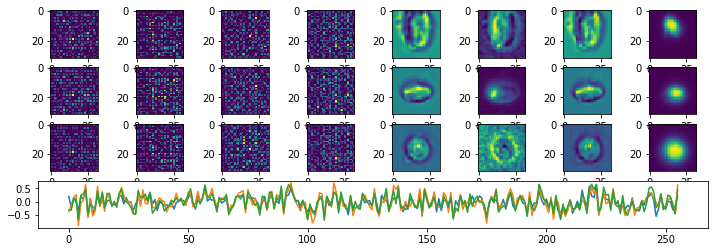

Epoch:  0 Iteration:  500 Loss:  14.613592 0.6364365 0.001866281


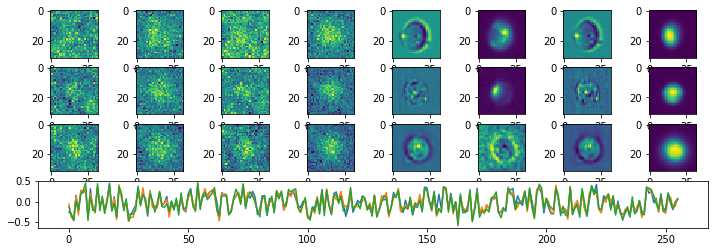

Epoch:  0 Iteration:  1000 Loss:  15.513909 0.63688475 0.0030896664


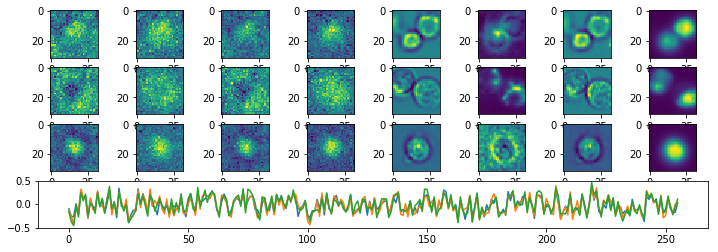

Epoch:  1 Iteration:  0 Loss:  11.9818 0.6348417 0.0020260215


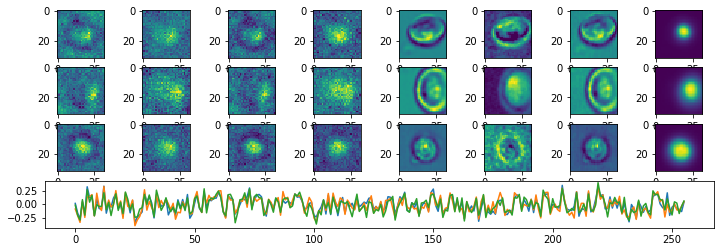

Epoch:  1 Iteration:  500 Loss:  10.355318 0.6341719 0.0022781193


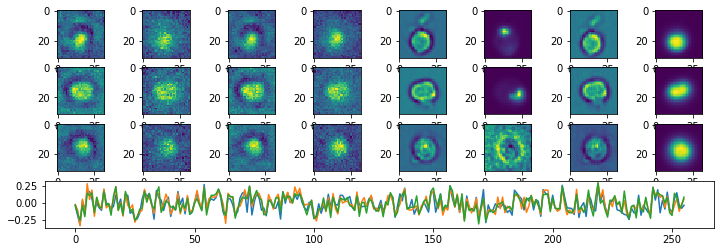

Epoch:  1 Iteration:  1000 Loss:  9.494328 0.63367355 0.00033849478


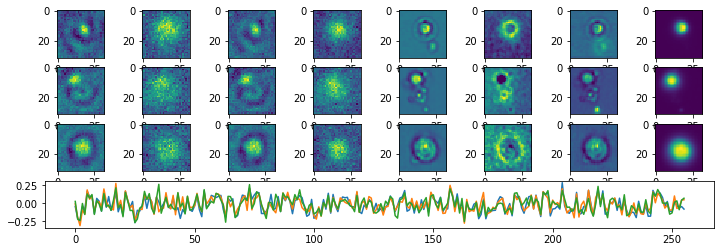

Epoch:  2 Iteration:  0 Loss:  8.334693 0.6329334 0.0018116236


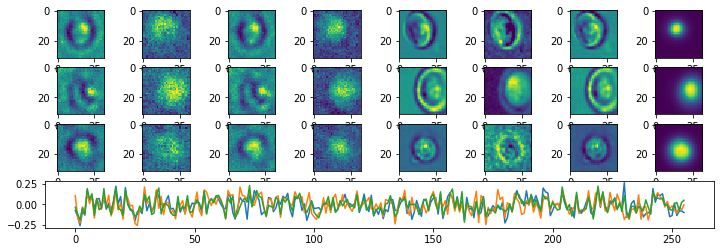

Epoch:  2 Iteration:  500 Loss:  7.3950057 0.63260937 0.0016724467


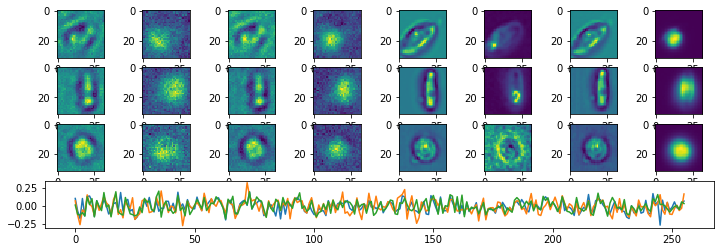

Epoch:  2 Iteration:  1000 Loss:  6.958544 0.6323674 0.0013232827


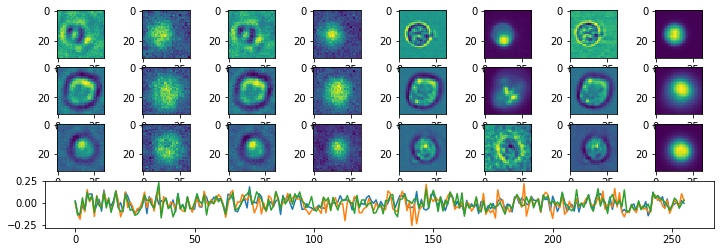

Epoch:  3 Iteration:  0 Loss:  6.591614 0.6320315 0.0013307929


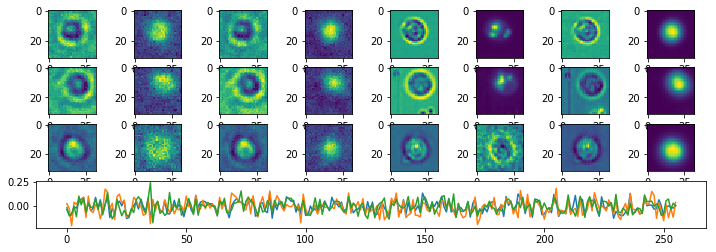

Epoch:  3 Iteration:  500 Loss:  6.2139626 0.6319965 0.0012897551


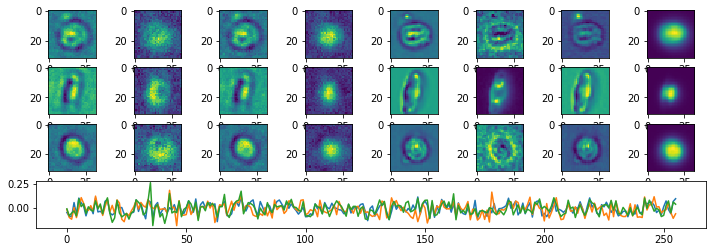

Epoch:  3 Iteration:  1000 Loss:  6.0122547 0.63191044 0.00059089065


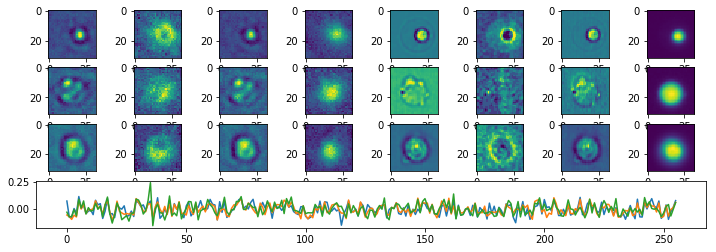

Epoch:  4 Iteration:  0 Loss:  5.697398 0.6315728 0.0012386441


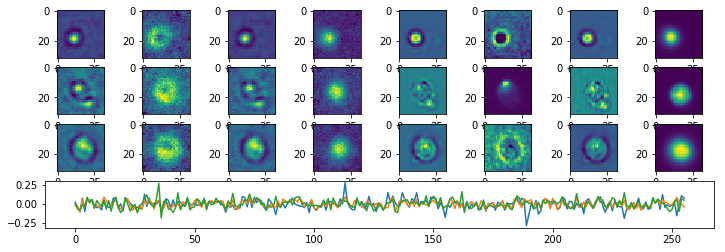

Epoch:  4 Iteration:  500 Loss:  5.5030813 0.63162816 0.0010203123


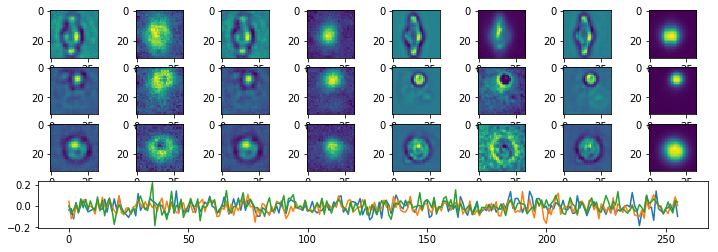

Epoch:  4 Iteration:  1000 Loss:  5.369506 0.6315464 0.0007317662


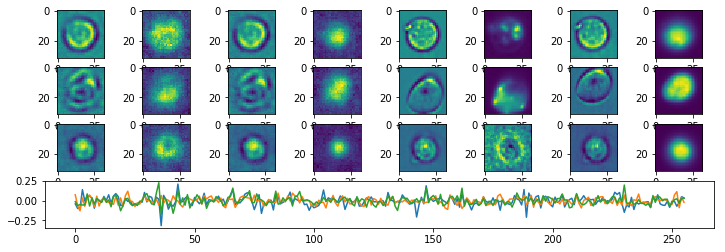

Epoch:  5 Iteration:  0 Loss:  4.955169 0.6311814 0.0011428893


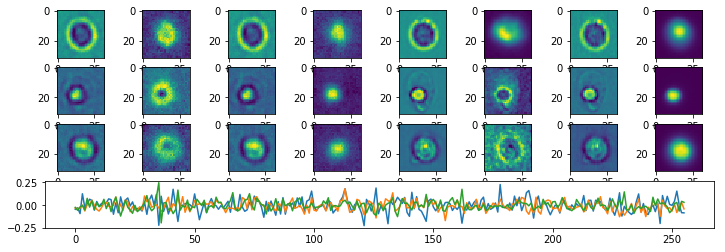

Epoch:  5 Iteration:  500 Loss:  4.851741 0.63128734 0.0010679066


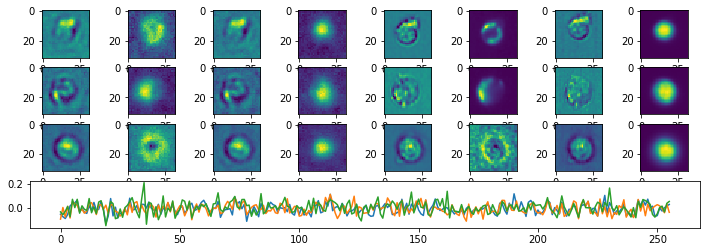

Epoch:  5 Iteration:  1000 Loss:  4.714096 0.6311989 0.00047785044


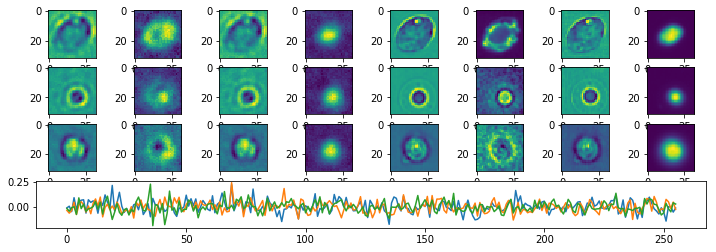

Epoch:  6 Iteration:  0 Loss:  4.511155 0.63094324 0.0014531612


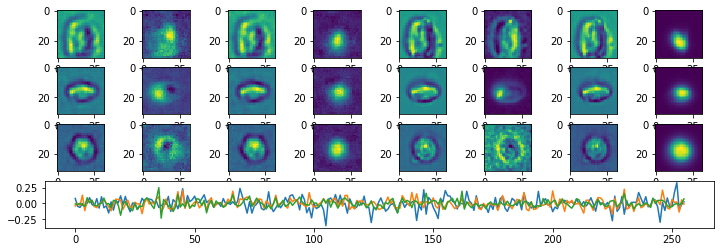

Epoch:  6 Iteration:  500 Loss:  4.472524 0.6310854 0.0012458861


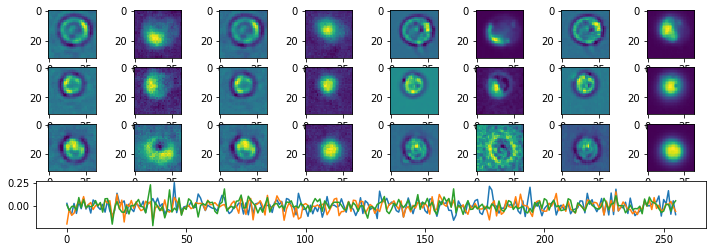

Epoch:  6 Iteration:  1000 Loss:  4.3273277 0.6309922 0.00065904856


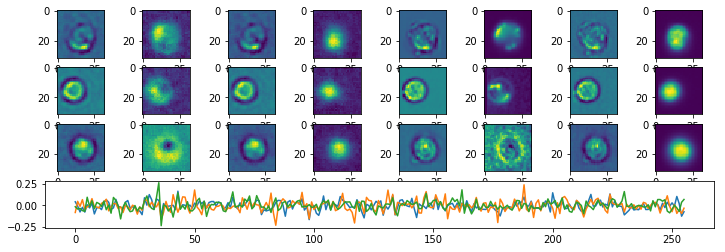

Epoch:  7 Iteration:  0 Loss:  4.1673594 0.63076246 0.00089517236


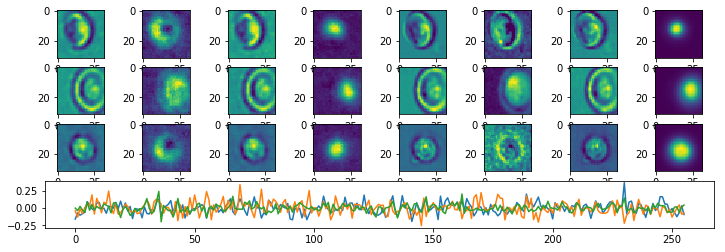

Epoch:  7 Iteration:  500 Loss:  4.133746 0.63090825 0.00069892406


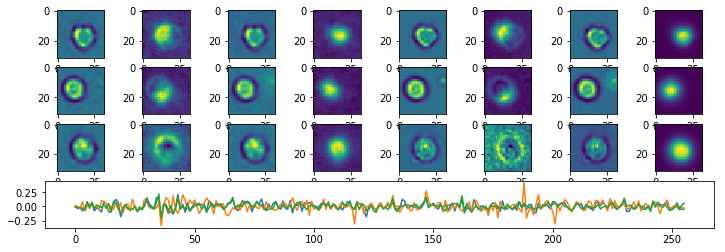

Epoch:  7 Iteration:  1000 Loss:  4.0607285 0.63085407 0.00045740604


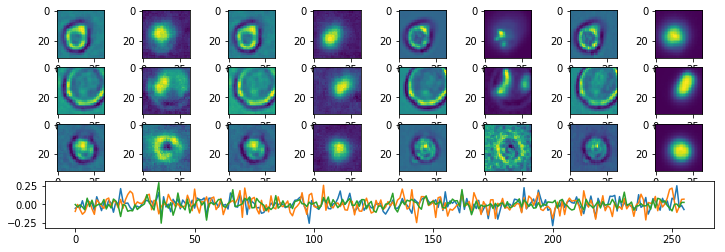

Epoch:  8 Iteration:  0 Loss:  3.911767 0.6306283 0.0009892583


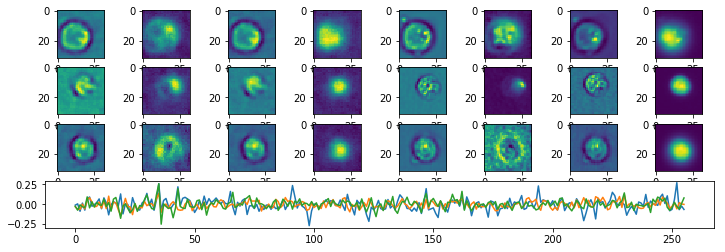

Epoch:  8 Iteration:  500 Loss:  3.9185953 0.6307966 0.0007174611


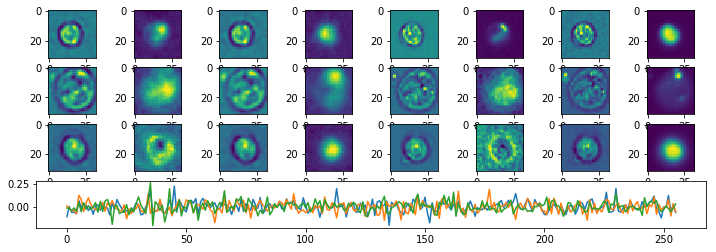

Epoch:  8 Iteration:  1000 Loss:  3.8688502 0.6307543 0.0008381009


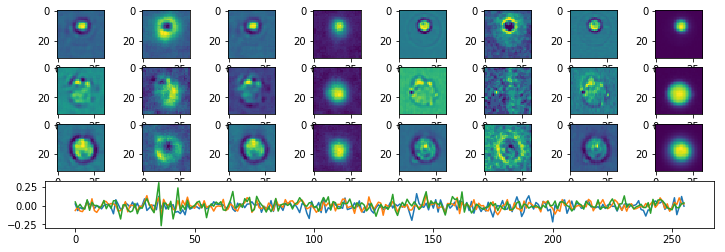

Epoch:  9 Iteration:  0 Loss:  3.6596003 0.6304965 0.0007775426


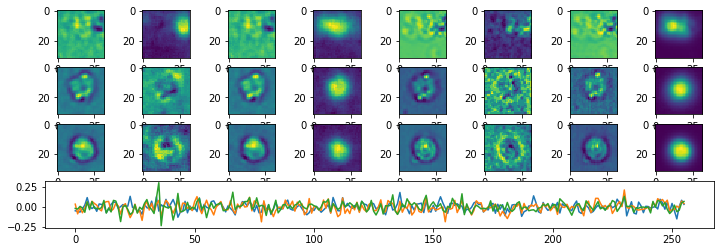

Epoch:  9 Iteration:  500 Loss:  3.699179 0.63068163 0.0006364584


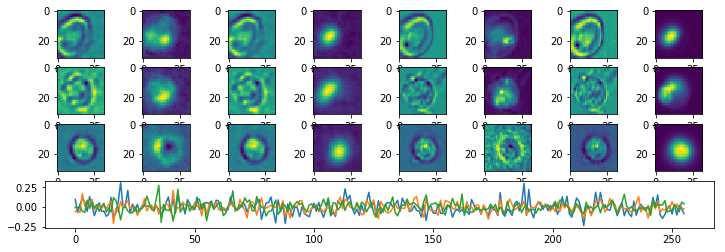

Epoch:  9 Iteration:  1000 Loss:  3.6497617 0.630638 0.00049620867


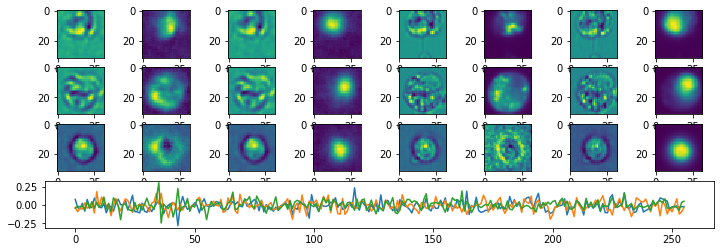

Epoch:  10 Iteration:  0 Loss:  3.5060072 0.63042027 0.000995189


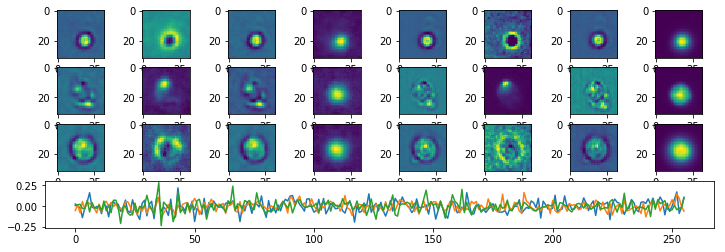

Epoch:  10 Iteration:  500 Loss:  3.5310326 0.6305948 0.00020435452


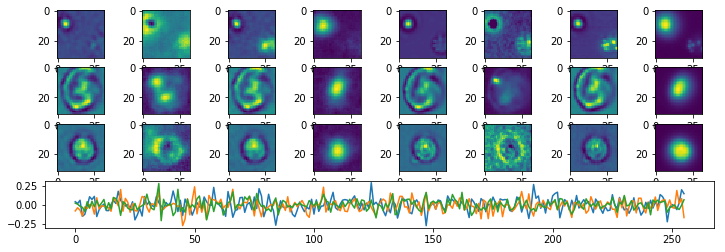

Epoch:  10 Iteration:  1000 Loss:  3.4477346 0.6305336 0.00065881014


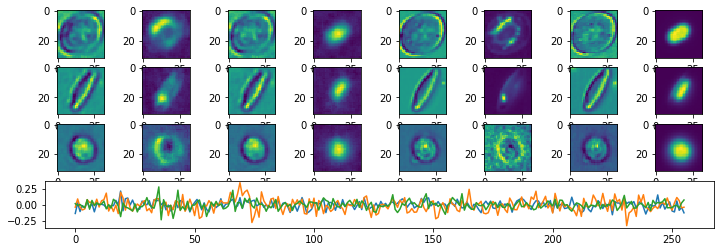

Epoch:  11 Iteration:  0 Loss:  3.2804217 0.63030094 0.0006418228


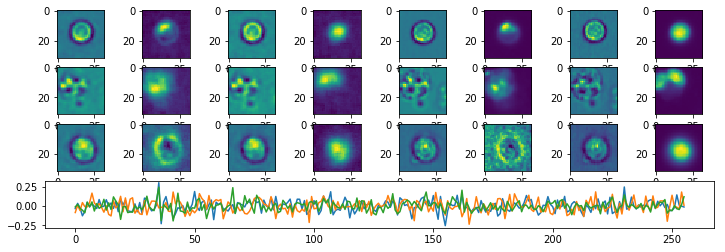

Epoch:  11 Iteration:  500 Loss:  3.3479881 0.6304992 0.00024718046


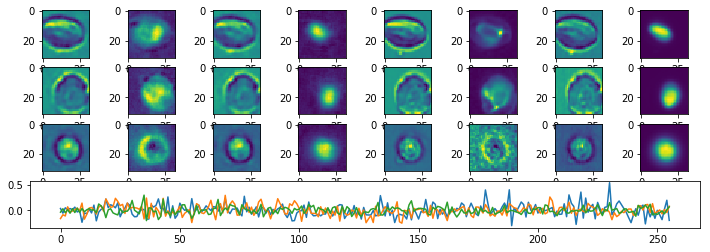

Epoch:  11 Iteration:  1000 Loss:  3.2600155 0.6304369 0.00068736076


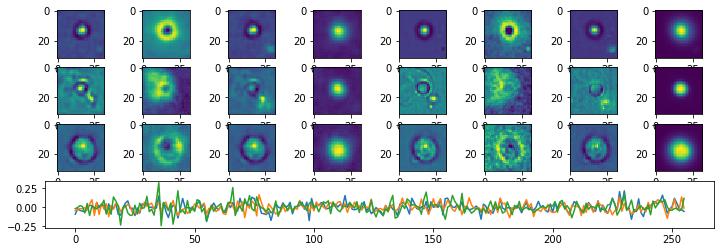

Epoch:  12 Iteration:  0 Loss:  3.1531696 0.6302317 0.0008148551


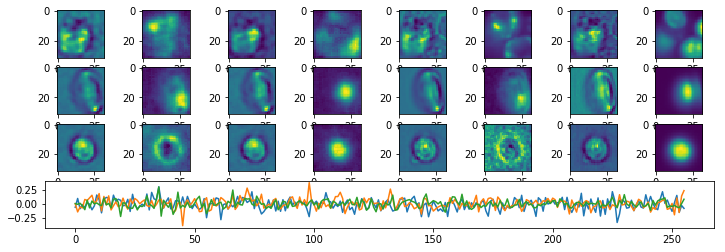

Epoch:  12 Iteration:  500 Loss:  3.176561 0.6304102 0.00013464689


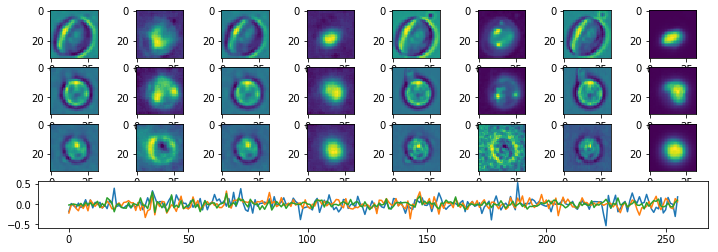

Epoch:  12 Iteration:  1000 Loss:  3.0869675 0.6303456 0.00067174435


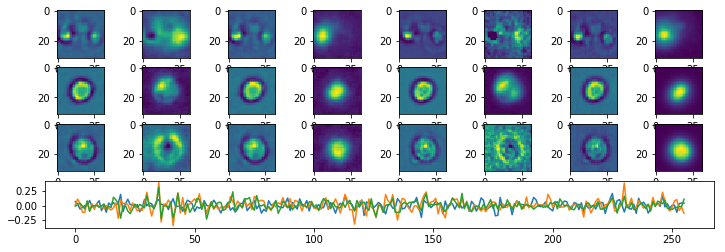

Epoch:  13 Iteration:  0 Loss:  2.9832914 0.6301452 0.00073862076


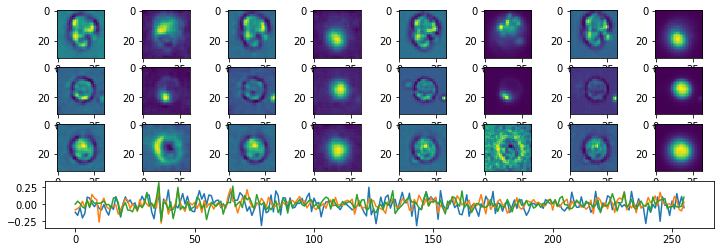

Epoch:  13 Iteration:  500 Loss:  3.0393605 0.63033986 0.0005438924


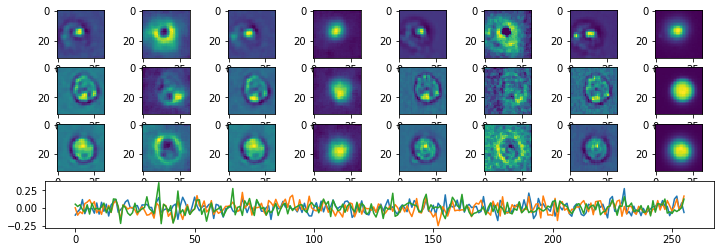

Epoch:  13 Iteration:  1000 Loss:  2.9266272 0.6302632 0.00032785535


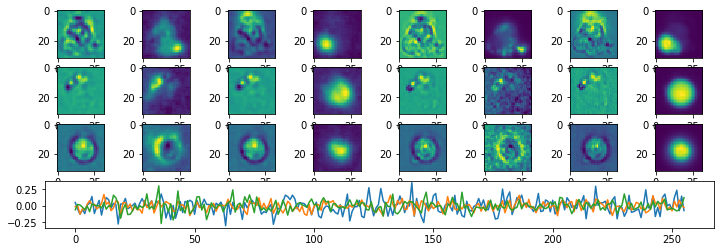

Epoch:  14 Iteration:  0 Loss:  2.8664122 0.6300837 0.00058215857


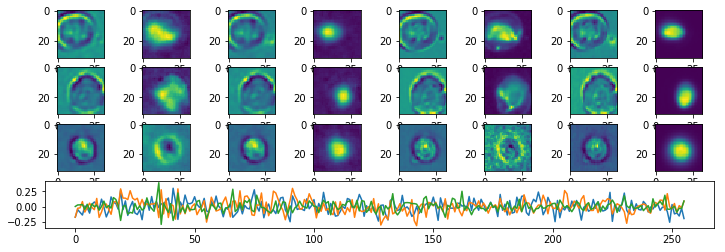

Epoch:  14 Iteration:  500 Loss:  2.9177032 0.63027596 0.00038856268


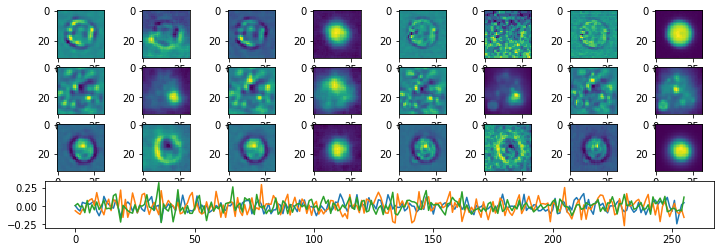

Epoch:  14 Iteration:  1000 Loss:  2.8185415 0.6302066 0.0004233122


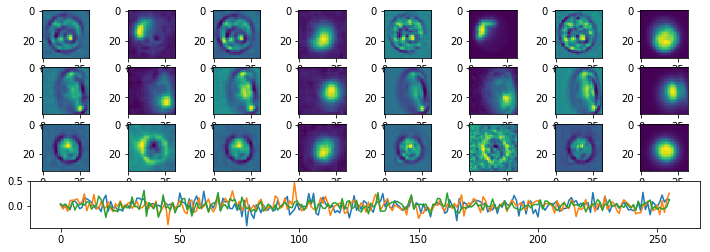

Epoch:  15 Iteration:  0 Loss:  2.7765508 0.6300382 0.00079637766


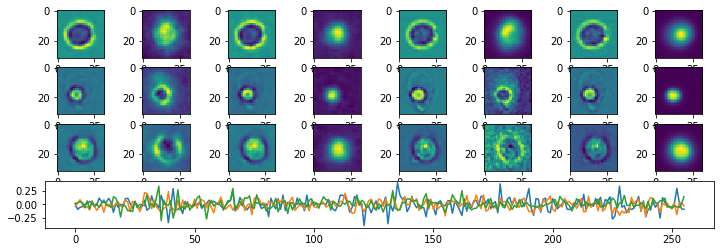

Epoch:  15 Iteration:  500 Loss:  2.8302033 0.63023126 0.00044578314


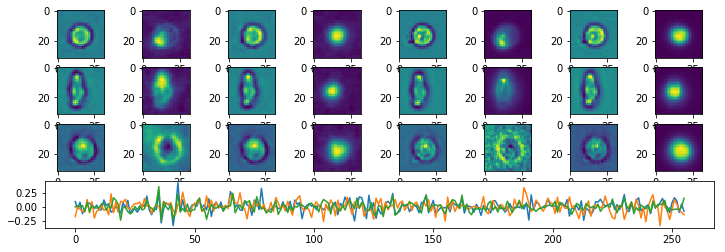

Epoch:  15 Iteration:  1000 Loss:  2.7235565 0.63015753 0.00016361475


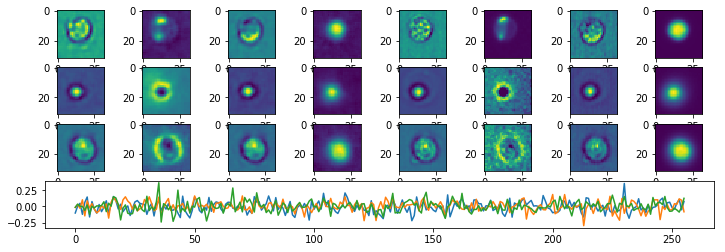

Epoch:  16 Iteration:  0 Loss:  2.6769009 0.6299865 0.00018274784


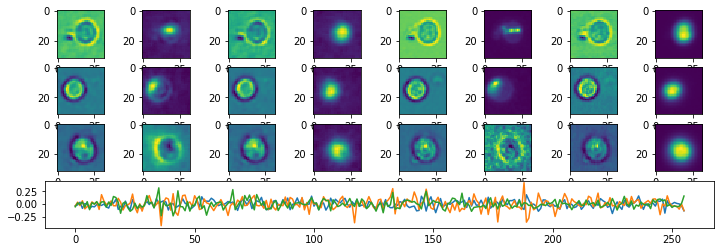

Epoch:  16 Iteration:  500 Loss:  2.7322679 0.63017964 0.00034227967


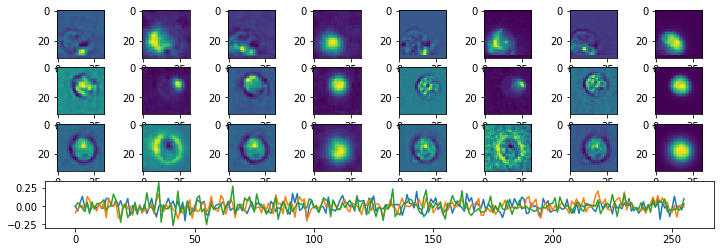

Epoch:  16 Iteration:  1000 Loss:  3.581138 0.6306083 0.00025692582


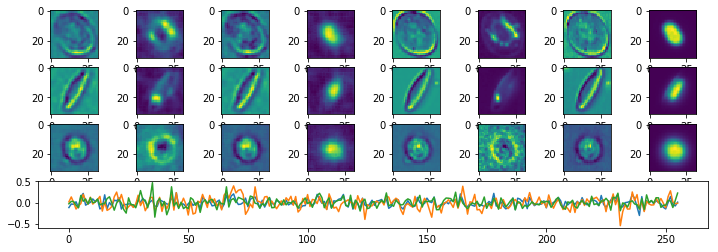

Epoch:  17 Iteration:  0 Loss:  3.0587525 0.6301881 0.00025248528


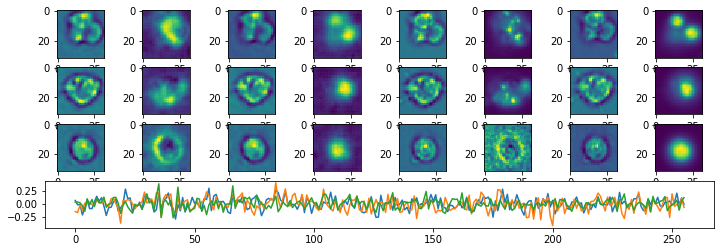

Epoch:  17 Iteration:  500 Loss:  3.011095 0.63032603 0.0005469918


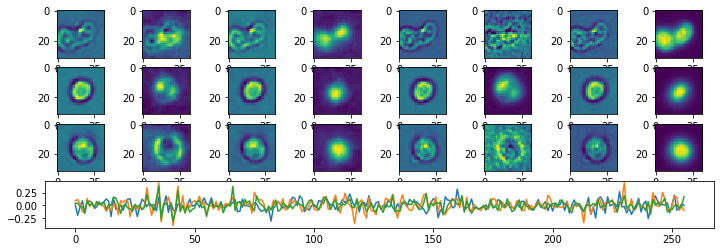

Epoch:  17 Iteration:  1000 Loss:  2.887381 0.6302433 0.0005518198


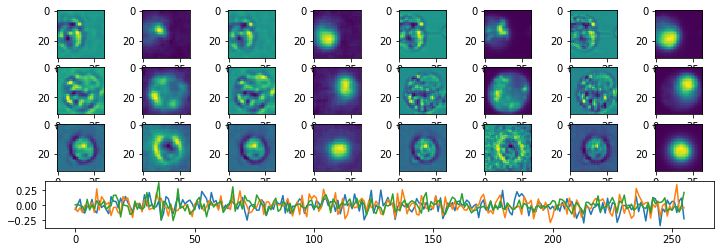

Epoch:  18 Iteration:  0 Loss:  2.8062835 0.6300524 0.00049972534


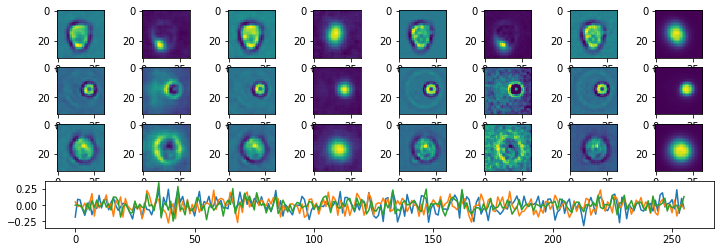

Epoch:  18 Iteration:  500 Loss:  2.8561108 0.6302465 0.00038170815


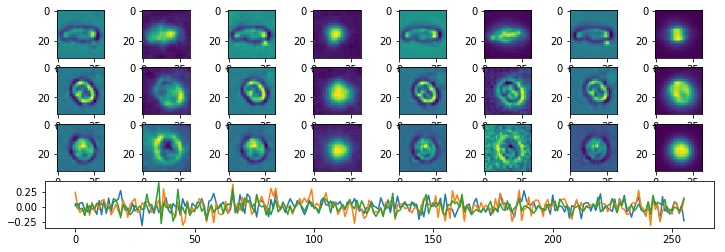

Epoch:  18 Iteration:  1000 Loss:  2.7373633 0.63016474 0.00033468008


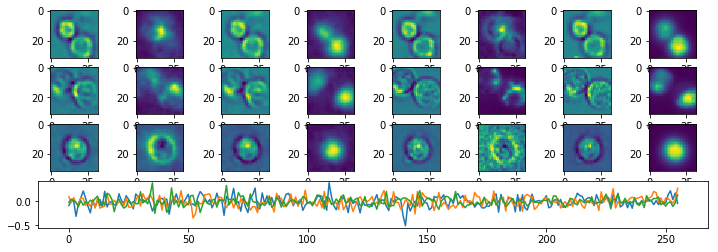

Epoch:  19 Iteration:  0 Loss:  2.7111666 0.6300025 0.0003761053


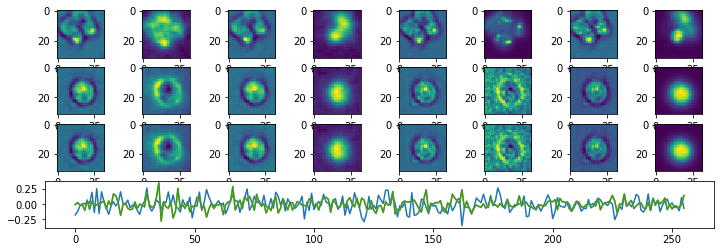

Epoch:  19 Iteration:  500 Loss:  2.7762632 0.63020235 0.00036749244


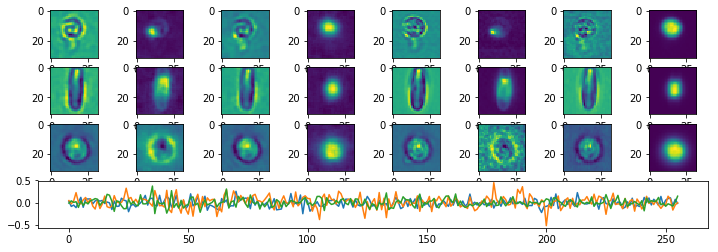

Epoch:  19 Iteration:  1000 Loss:  2.664846 0.63012666 0.000451684


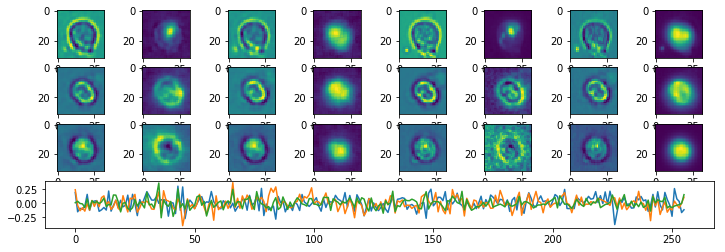

Epoch:  20 Iteration:  0 Loss:  2.643505 0.6299678 0.00038605928


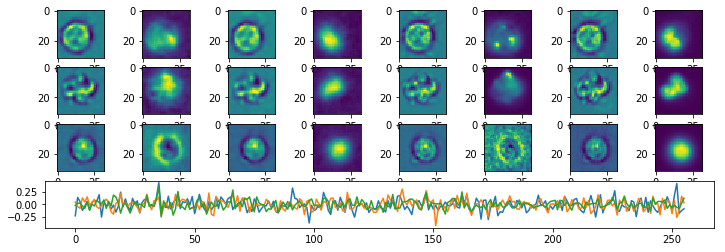

Epoch:  20 Iteration:  500 Loss:  2.7277563 0.630178 0.00036734343


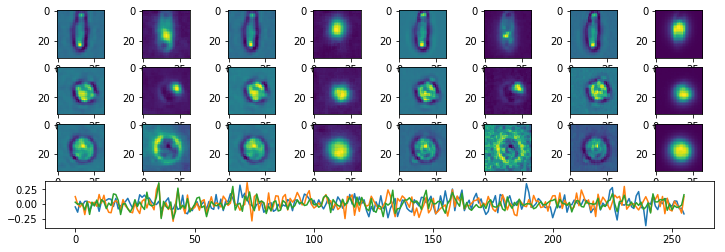

Epoch:  20 Iteration:  1000 Loss:  2.6452098 0.63011706 0.0004349947


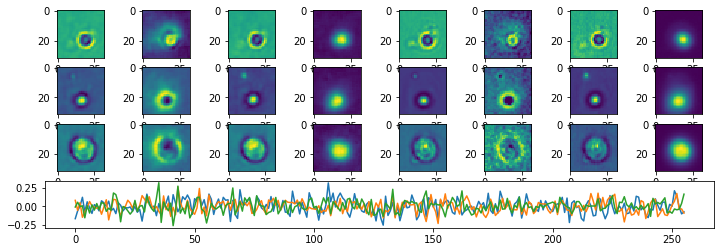

Epoch:  21 Iteration:  0 Loss:  2.6240616 0.62995774 0.00053083897


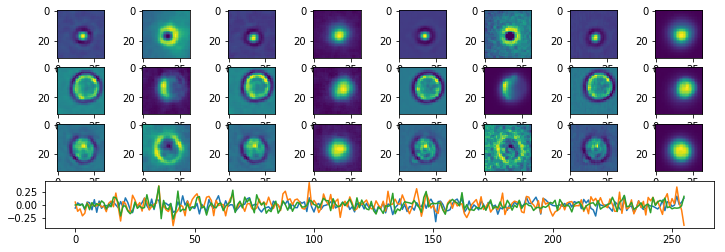

Epoch:  21 Iteration:  500 Loss:  2.6820245 0.6301534 0.0005789995


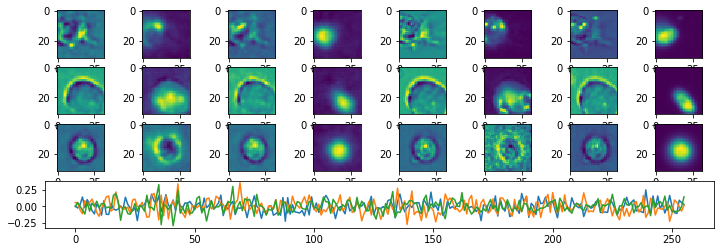

Epoch:  21 Iteration:  1000 Loss:  2.610601 0.63009804 0.00025710464


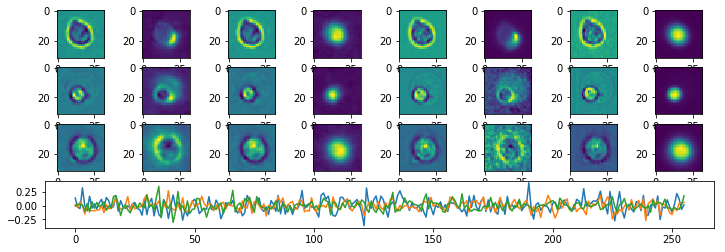

Epoch:  22 Iteration:  0 Loss:  2.575222 0.6299317 0.0006401837


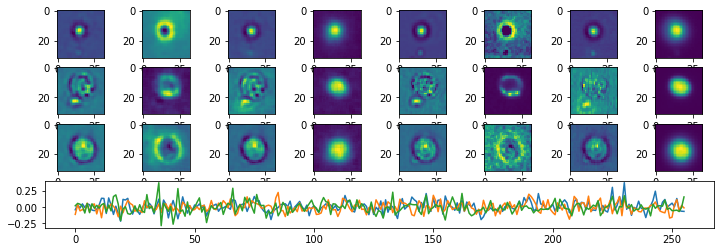

Epoch:  22 Iteration:  500 Loss:  2.6593418 0.63014245 0.00047266483


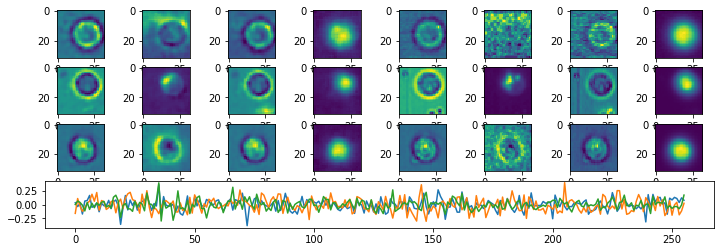

Epoch:  22 Iteration:  1000 Loss:  2.5858886 0.6300856 0.00027242303


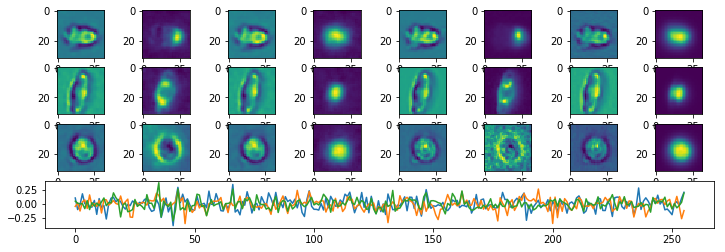

Epoch:  23 Iteration:  0 Loss:  2.549206 0.62991816 0.00039219856


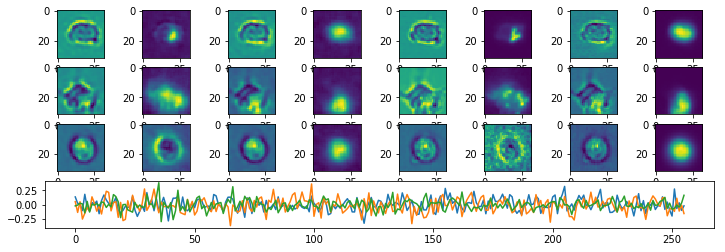

Epoch:  23 Iteration:  500 Loss:  2.6292477 0.63012534 0.0007996559


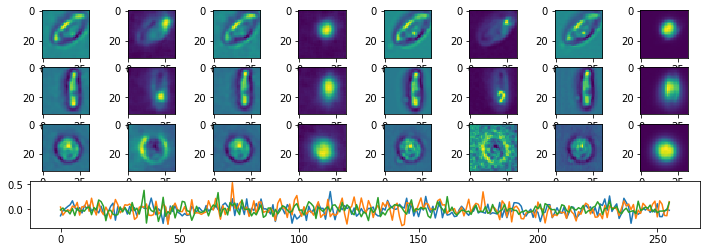

Epoch:  23 Iteration:  1000 Loss:  2.557998 0.6300708 0.0004682243


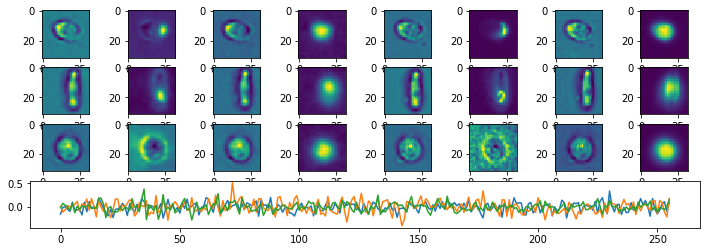

Epoch:  24 Iteration:  0 Loss:  2.527214 0.6299076 0.0007631779


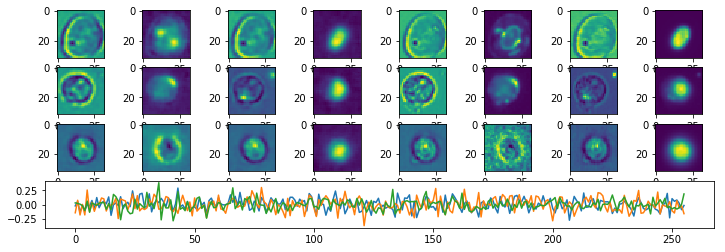

Epoch:  24 Iteration:  500 Loss:  2.5962753 0.6301097 0.00063455105


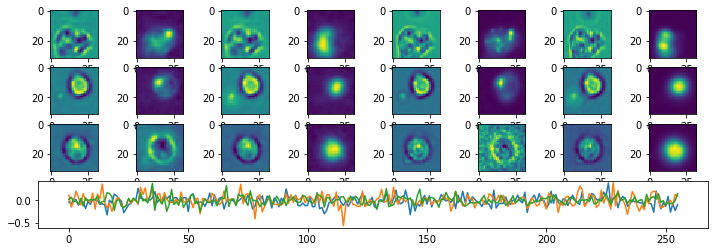

Epoch:  24 Iteration:  1000 Loss:  2.532289 0.6300581 0.0008339286


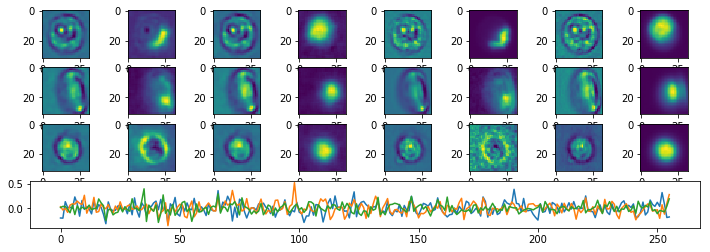

Epoch:  25 Iteration:  0 Loss:  2.486864 0.62988615 0.0007622242


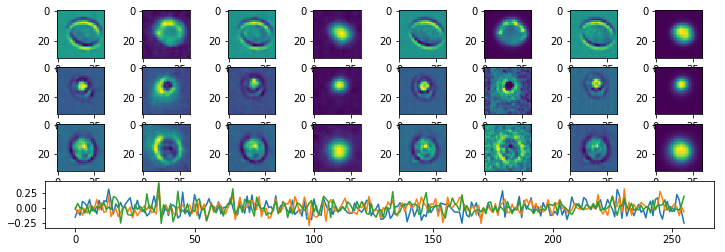

Epoch:  25 Iteration:  500 Loss:  2.5391307 0.6300802 0.0004402101


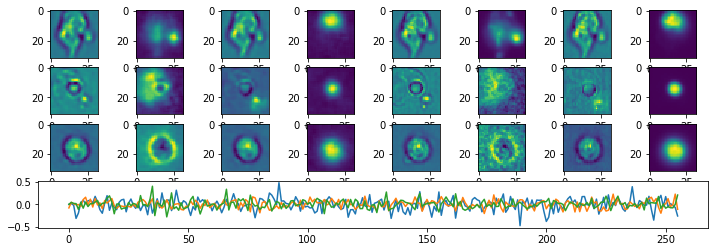

Epoch:  25 Iteration:  1000 Loss:  2.497529 0.63003945 0.0003014803


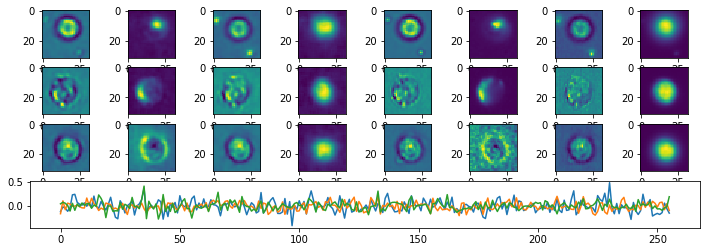

Epoch:  26 Iteration:  0 Loss:  2.451982 0.6298672 0.0005404949


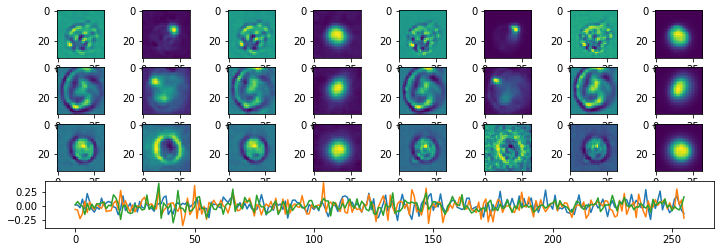

Epoch:  26 Iteration:  500 Loss:  2.5408711 0.63008076 0.00064209104


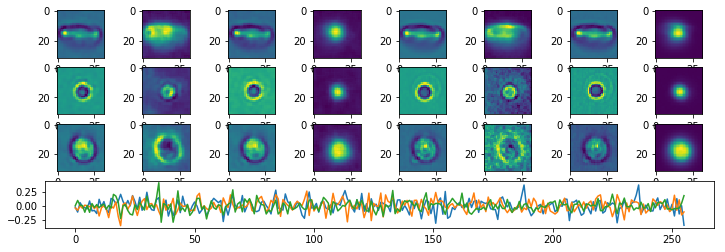

Epoch:  26 Iteration:  1000 Loss:  2.453874 0.6300168 0.0005173981


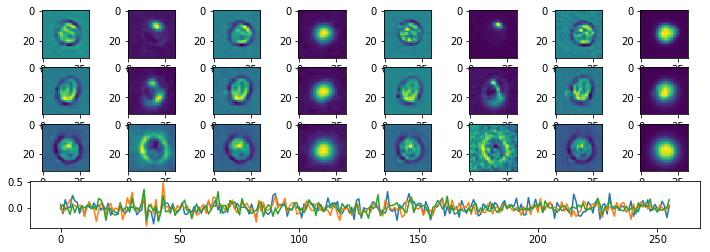

Epoch:  27 Iteration:  0 Loss:  2.4359393 0.6298605 0.00077956915


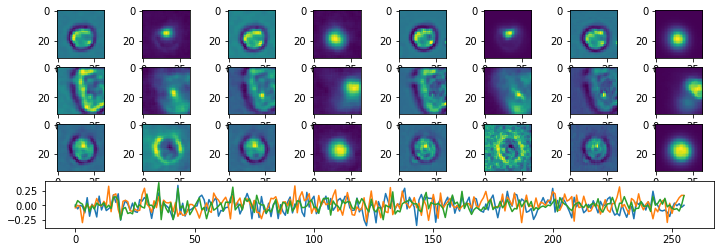

Epoch:  27 Iteration:  500 Loss:  2.514402 0.630067 0.0005773306


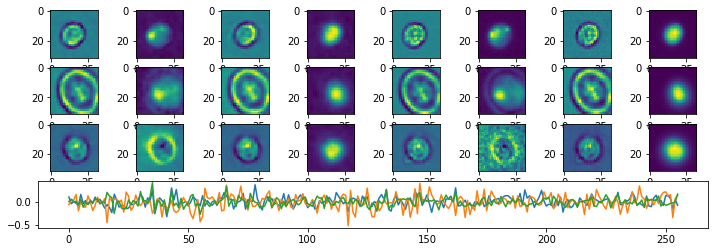

Epoch:  27 Iteration:  1000 Loss:  2.4316494 0.630005 0.00021234155


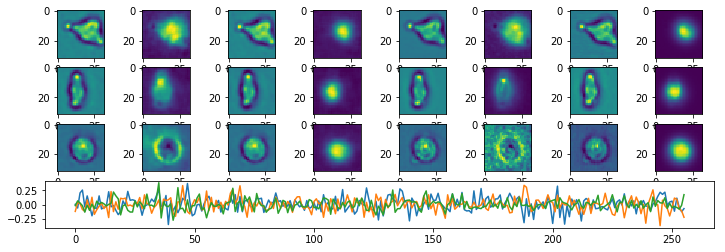

Epoch:  28 Iteration:  0 Loss:  2.407692 0.62984353 0.0001810193


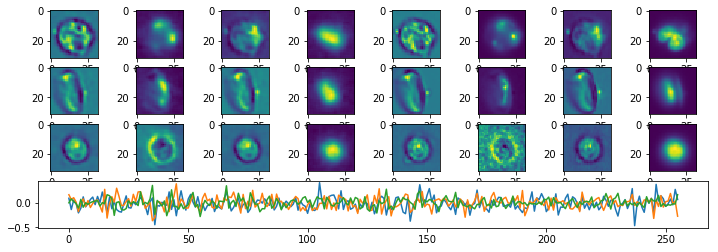

Epoch:  28 Iteration:  500 Loss:  2.4708614 0.63004297 0.00021332502


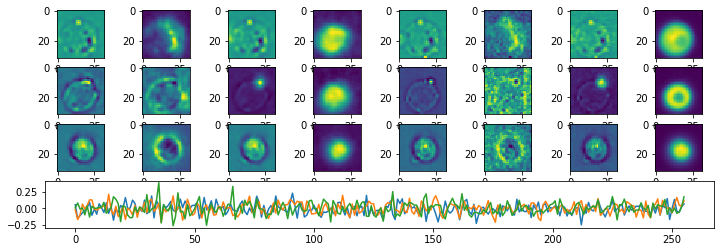

Epoch:  28 Iteration:  1000 Loss:  2.4123325 0.62999445 0.00017493963


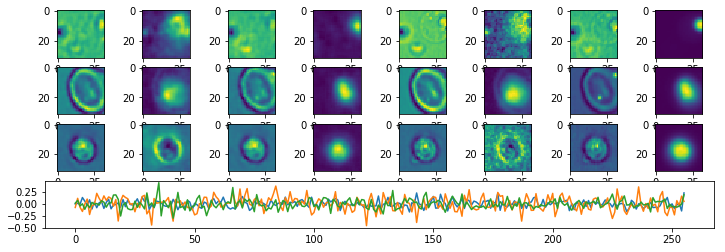

Epoch:  29 Iteration:  0 Loss:  2.3744345 0.62982607 0.00031000376


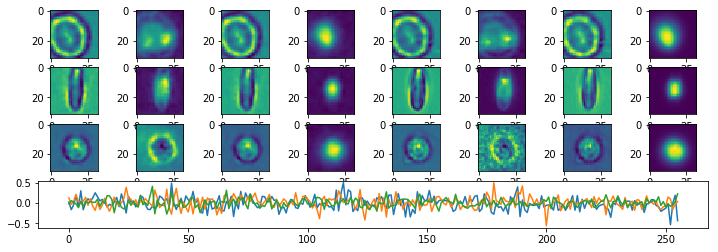

Epoch:  29 Iteration:  500 Loss:  2.4544888 0.63003504 0.00028562546


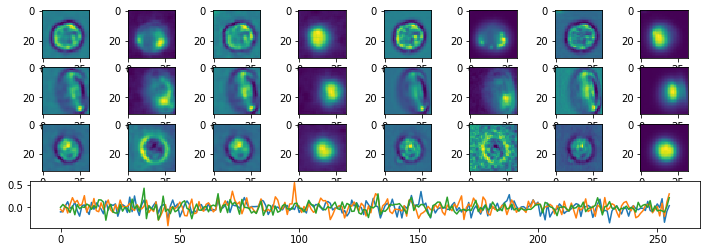

Epoch:  29 Iteration:  1000 Loss:  2.3945982 0.629985 0.00030595064


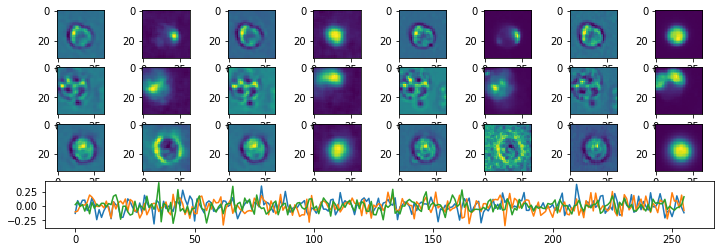

Epoch:  30 Iteration:  0 Loss:  2.3603272 0.6298193 0.00022420287


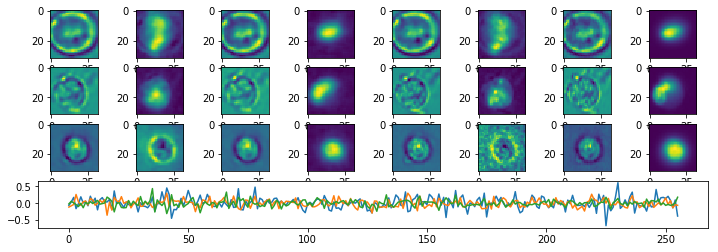

Epoch:  30 Iteration:  500 Loss:  2.4368703 0.6300254 0.00051119924


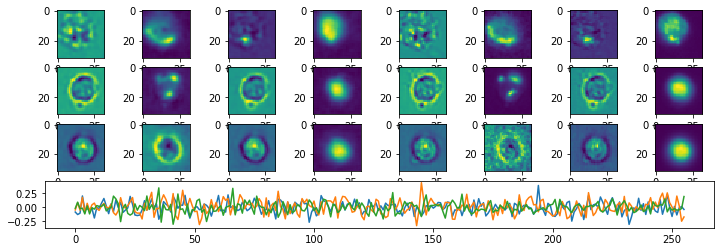

Epoch:  30 Iteration:  1000 Loss:  2.3893077 0.6299819 0.00020933151


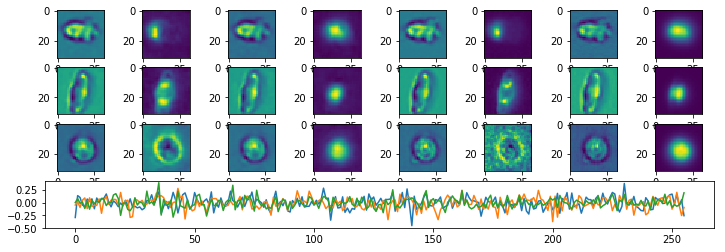

Epoch:  31 Iteration:  0 Loss:  2.3503973 0.6298146 0.0005572438


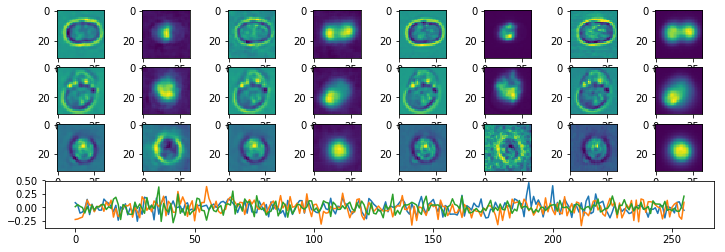

Epoch:  31 Iteration:  500 Loss:  2.422256 0.63002163 0.0005451441


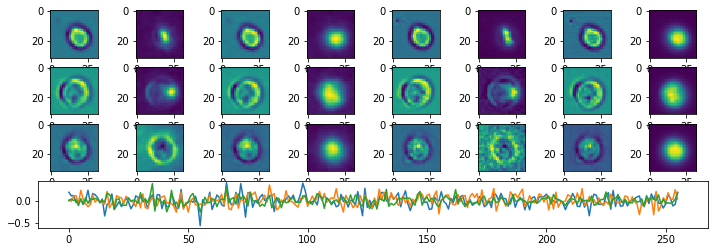

Epoch:  31 Iteration:  1000 Loss:  2.3631148 0.6299688 0.0003169179


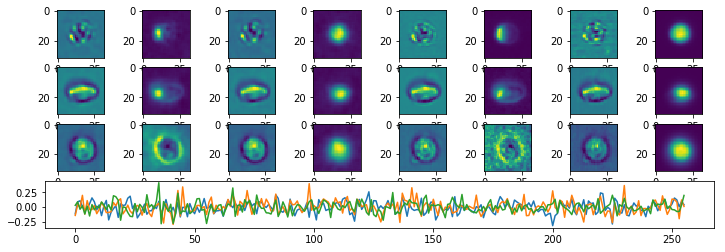

Epoch:  32 Iteration:  0 Loss:  2.3405952 0.62980986 0.0008494854


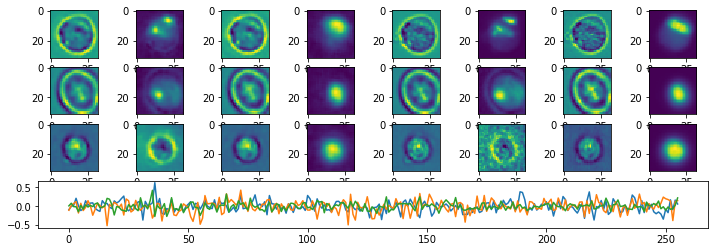

Epoch:  32 Iteration:  500 Loss:  2.440264 0.63003457 0.00057947636


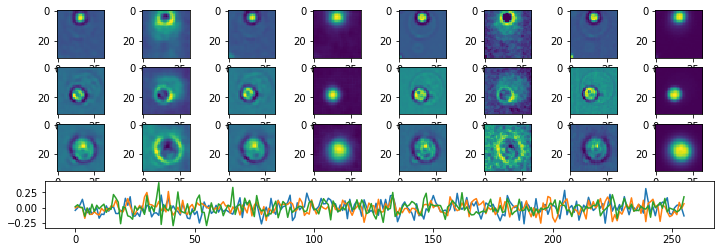

Epoch:  32 Iteration:  1000 Loss:  2.3424168 0.6299579 0.00051131845


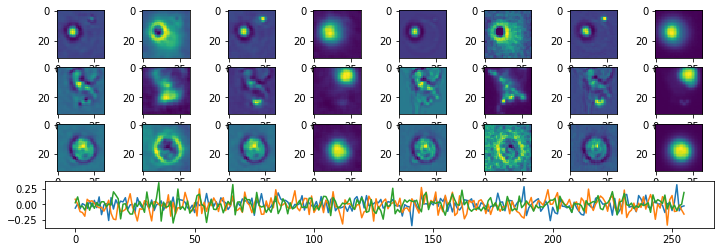

Epoch:  33 Iteration:  0 Loss:  2.339787 0.6298092 0.00066927075


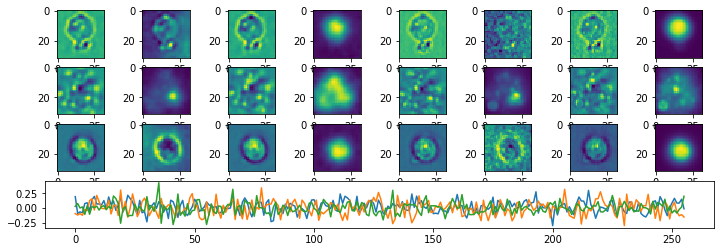

Epoch:  33 Iteration:  500 Loss:  3.2916842 0.63047415 0.00078073144


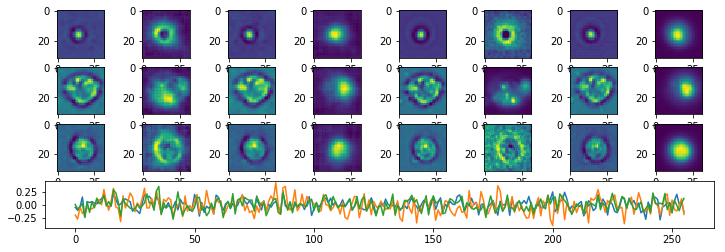

Epoch:  33 Iteration:  1000 Loss:  2.6610708 0.63012725 0.00035846233


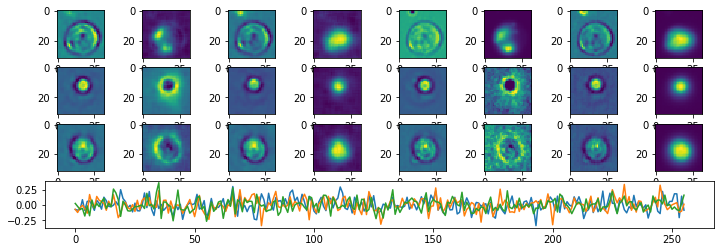

Epoch:  34 Iteration:  0 Loss:  2.5198839 0.6299061 0.00028252602


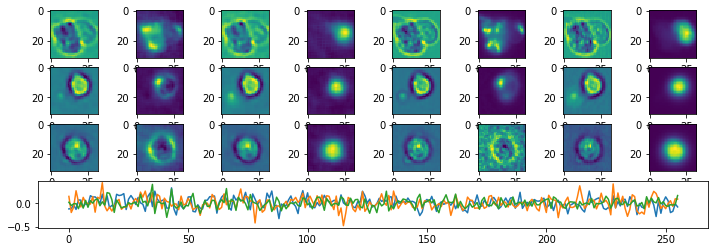

Epoch:  34 Iteration:  500 Loss:  2.5447607 0.63008314 0.0003232956


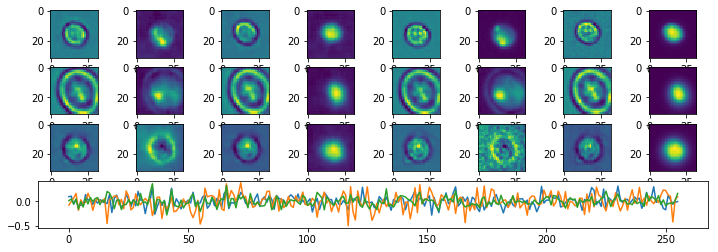

Epoch:  34 Iteration:  1000 Loss:  2.4448967 0.6300137 0.00022113323


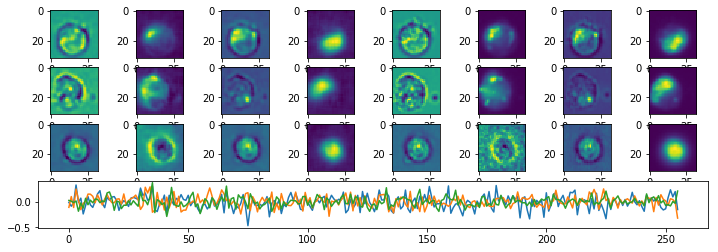

Epoch:  35 Iteration:  0 Loss:  2.3913703 0.62983733 0.00023850799


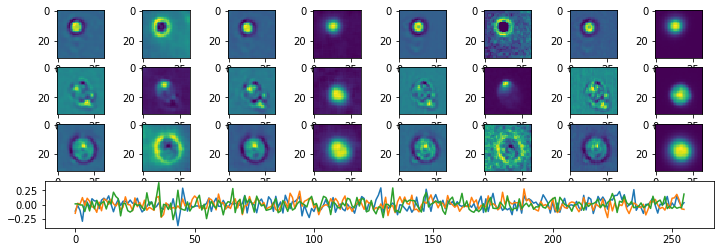

Epoch:  35 Iteration:  500 Loss:  2.461728 0.6300473 0.0002567172


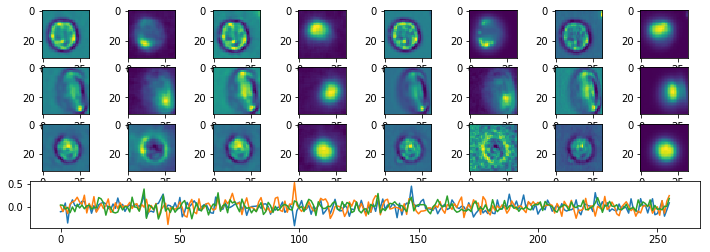

Epoch:  35 Iteration:  1000 Loss:  2.3819323 0.6299801 0.00025960803


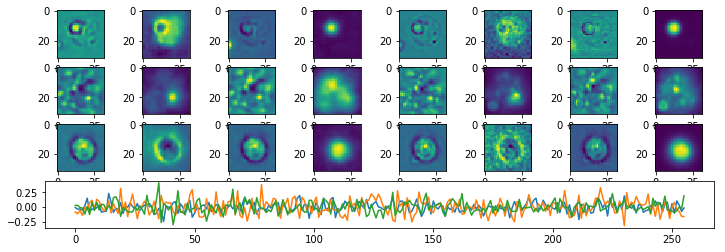

Epoch:  36 Iteration:  0 Loss:  2.336388 0.62980723 0.00028127432


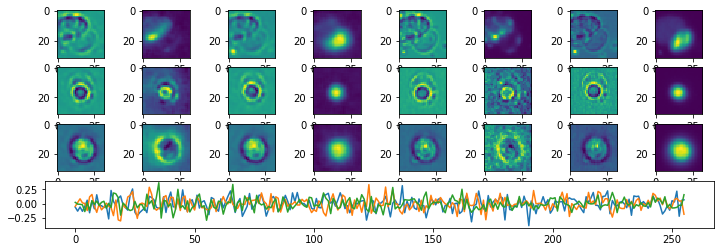

Epoch:  36 Iteration:  500 Loss:  2.4044392 0.63000906 0.00029021502


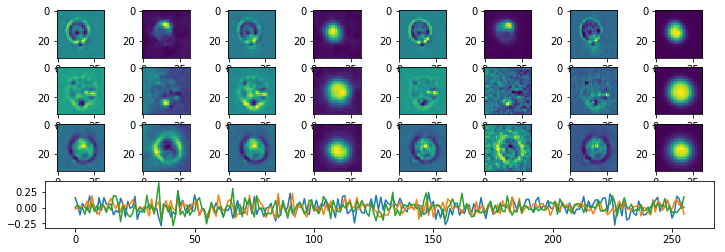

Epoch:  36 Iteration:  1000 Loss:  2.339457 0.62995684 0.00022938848


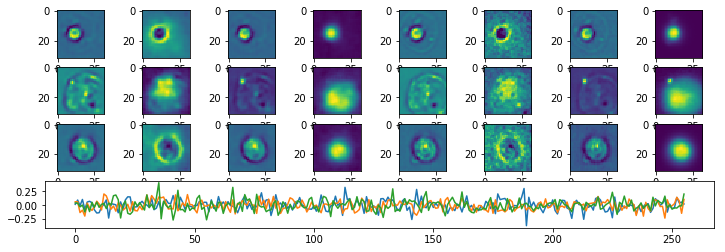

Epoch:  37 Iteration:  0 Loss:  2.3146152 0.62979525 0.00037896633


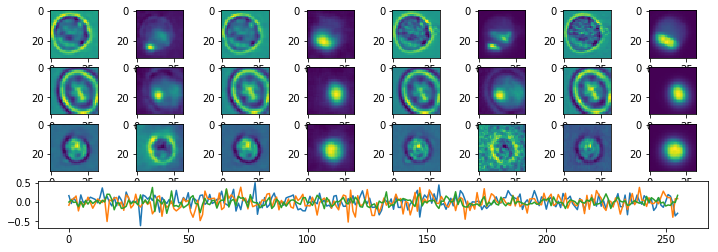

Epoch:  37 Iteration:  500 Loss:  2.3922524 0.63000524 0.00018262863


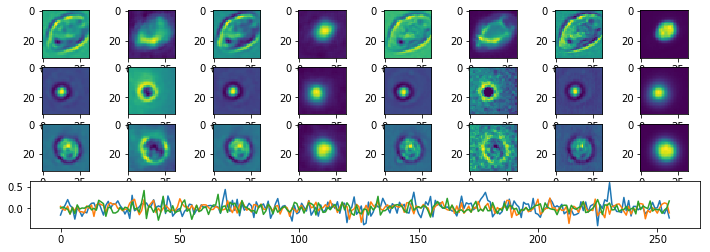

Epoch:  37 Iteration:  1000 Loss:  2.3215911 0.6299471 0.0002694726


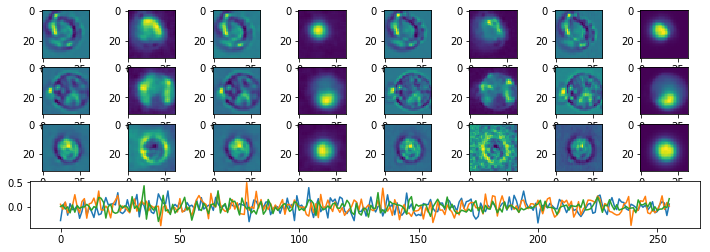

Epoch:  38 Iteration:  0 Loss:  2.2953537 0.6297854 0.00058683753


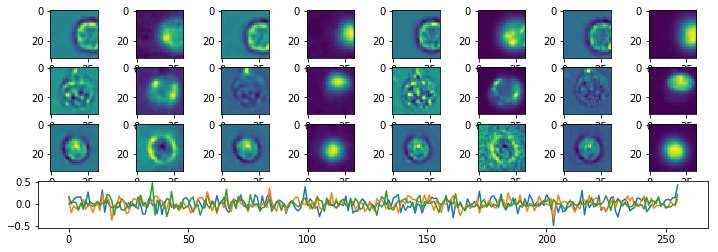

Epoch:  38 Iteration:  500 Loss:  2.389227 0.6300082 0.0004016459


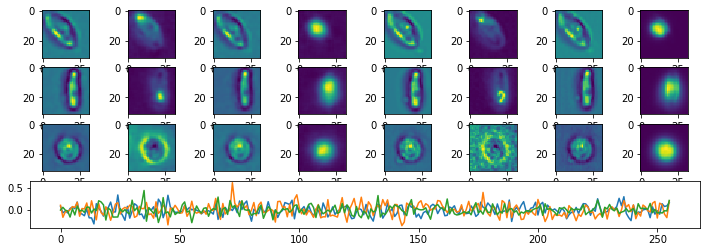

Epoch:  38 Iteration:  1000 Loss:  2.3270106 0.62995094 0.00010043383


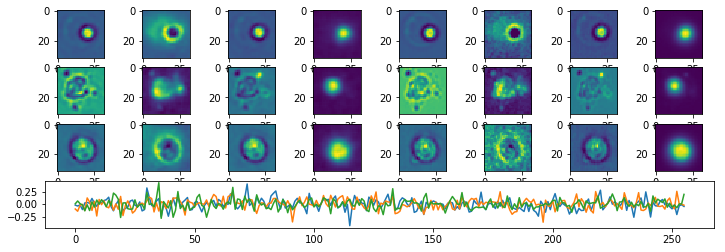

Epoch:  39 Iteration:  0 Loss:  2.288331 0.6297809 0.00059849024


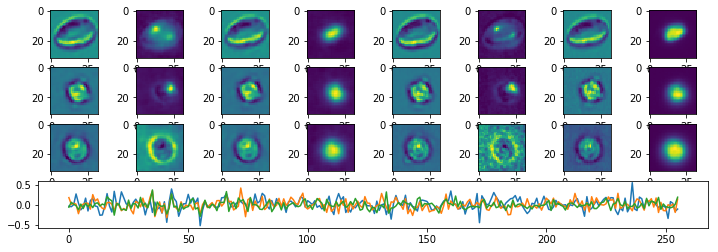

Epoch:  39 Iteration:  500 Loss:  2.363082 0.62999135 0.00027048588


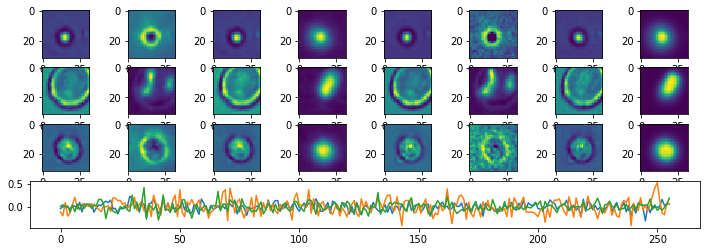

Epoch:  39 Iteration:  1000 Loss:  2.3060389 0.6299389 0.00028455257


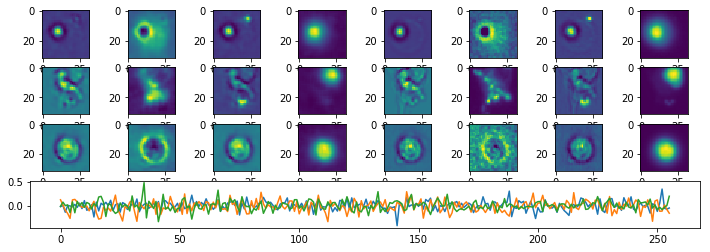

Done


In [4]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 40
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 256 #128 + 64
p_droprate = 0.95
p_stdev = .04
p_denoise = .20

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev
params['denoise'] = p_denoise

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-05-22-Denoise"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4